In [1]:
from skimage import morphology, io, filters, transform, color, draw
import matplotlib.pyplot as plt
import numpy as np
import os
import time

In [4]:
path_raw = '/home/rodrigo.souza/Documents/HRTEM/datasets/HRTEM_Fe3O4_T1_420kx/raw/'
path_crops = '/home/rodrigo.souza/Documents/HRTEM/datasets/HRTEM_Fe3O4_T1_420kx/crops/'

# Test method in one img

In [6]:
file_name = 'HRTEM_0180.tif'
img = io.imread(path_raw + file_name, as_gray=True)
print('dtype =', img.dtype)
print('Size =', img.nbytes/(1024*1024), 'Mb')

dtype = uint8
Size = 16.0 Mb


## Downsizing

New rsimg (resized img) shape = (512, 512)


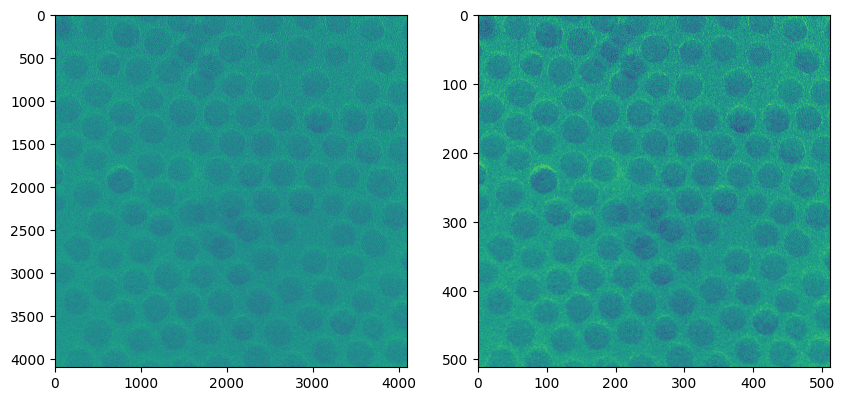

In [7]:
def downsample(img, sample_size = 8):
    if img.shape[0] % sample_size != 0:
        print('Erro: Shape não divisível pelo sample_size')
    else:
        rsimg = transform.resize(img, (img.shape[0] // sample_size, img.shape[1] // sample_size), anti_aliasing=True) # resize funciona por bilinear interpolation. Anti_aliasing smooths out high-frequency components
        rsimg = rsimg.astype(np.float32)
        return(rsimg)

rsimg = downsample(img)
fig,ax = plt.subplots(1,2, figsize=(10,5))
ax[0].imshow(img)
ax[1].imshow(rsimg)
print('New rsimg (resized img) shape =', rsimg.shape)

dtype = float32
Size = 1.0 Mb


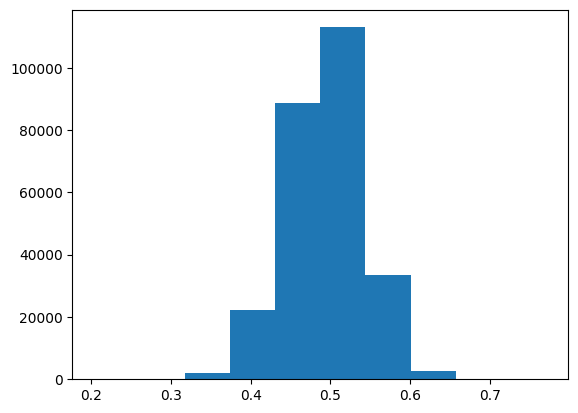

In [8]:
plt.hist(rsimg.ravel()) # Note that pixel intensities were normalized
print('dtype =', rsimg.dtype)
print('Size =', rsimg.nbytes/(1024*1024), 'Mb')

## Segmentation

### Via Thresholding and Math Morphology

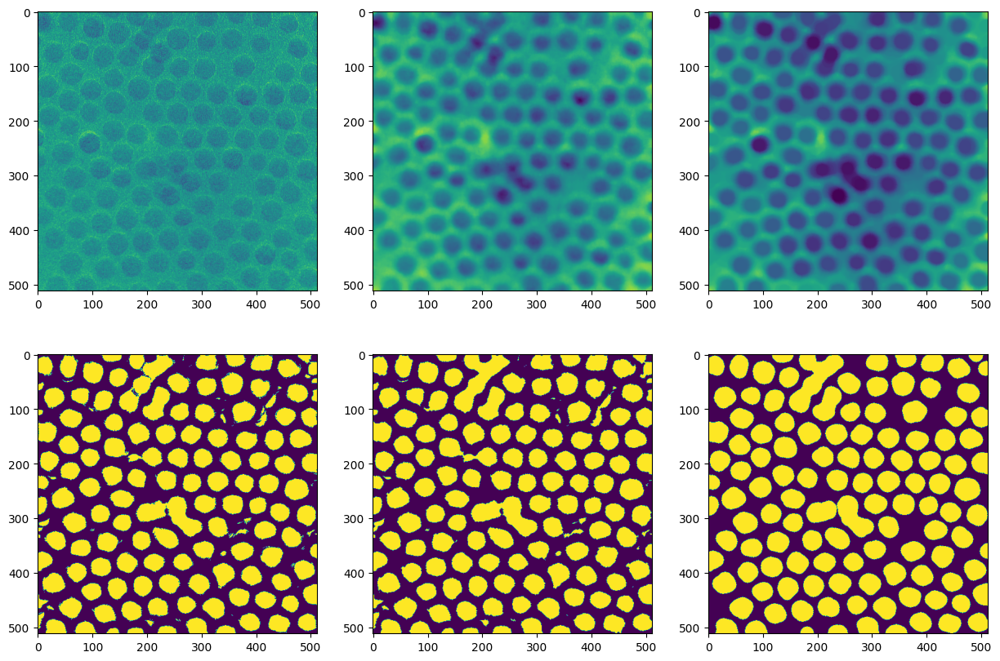

In [9]:
def img_to_segmented_bin(img, adj_disk_size = 10, thresh_block_size = 45, return_info = False): # sizes associados ao tamanho da NP em pixels
    img_copy = img.copy()
    A = morphology.disk(adj_disk_size)
    fimg = filters.median(img_copy, A)
    cimg = morphology.closing(fimg, A)
    thresh = filters.threshold_local(cimg, block_size = thresh_block_size, offset = 0.0001)
    bin1 = cimg > thresh
    bin1 = ~bin1
    A2 = morphology.disk(2)
    bin2 = morphology.closing(bin1, A2)
    final_bin = morphology.opening(bin2, A)
    final_bin = morphology.dilation(final_bin, A2)
    
    if return_info:
        return(final_bin, fimg, cimg, bin1, bin2)
    else:
        return(final_bin)

bin, fimg, cimg, bin1, bin2 = img_to_segmented_bin(rsimg, return_info = True)

fig,ax = plt.subplots(2,3, figsize=(15,10))
ax[0,0].imshow(rsimg)
ax[0,1].imshow(fimg)
ax[0,2].imshow(cimg)
ax[1,0].imshow(bin1)
ax[1,1].imshow(bin2)
ax[1,2].imshow(bin)

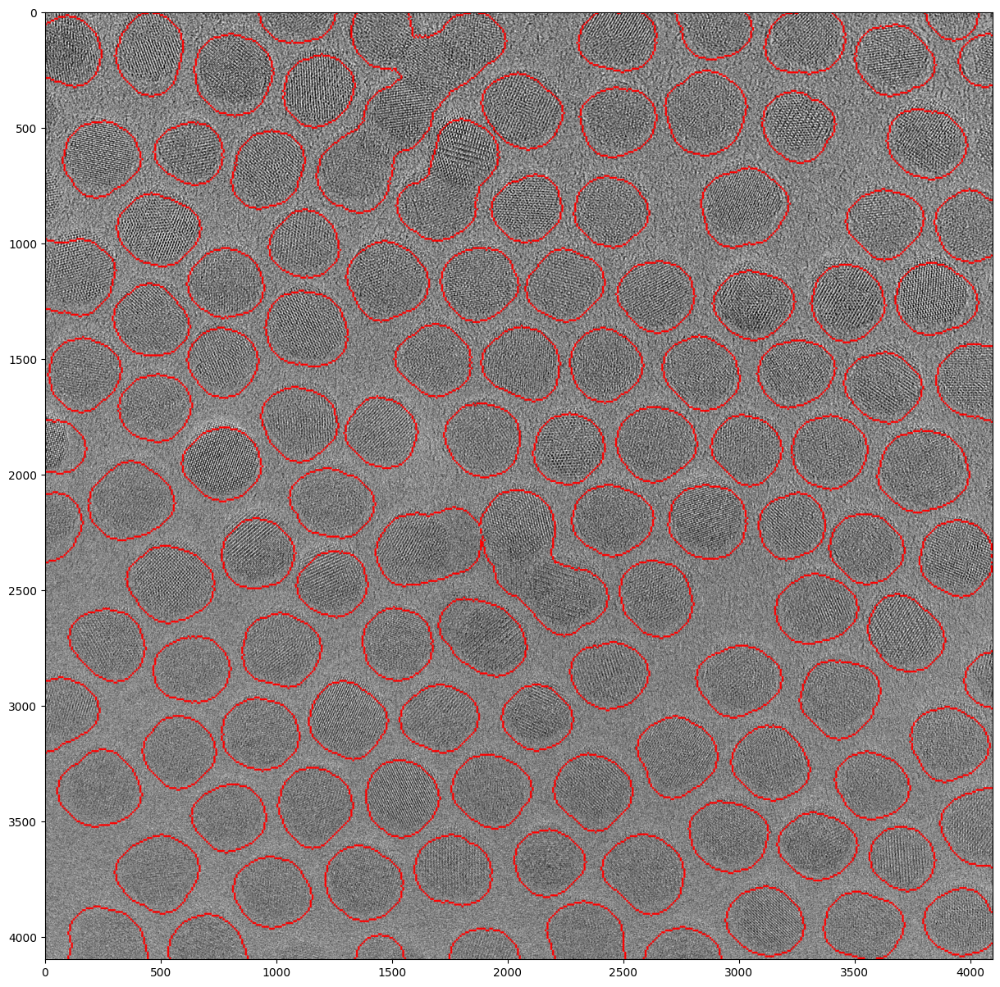

In [25]:
border_img = morphology.dilation(bin) ^ bin
up_border_img = transform.resize(border_img, img.shape[:2], mode='constant', preserve_range=True)
hraw = img.copy()
hraw = color.gray2rgb(hraw)/np.max(img)
hraw[up_border_img] = [1,0,0]

plt.figure(figsize=(15,15))
plt.imshow(hraw)

regions before: 118
regions after filtering: 114


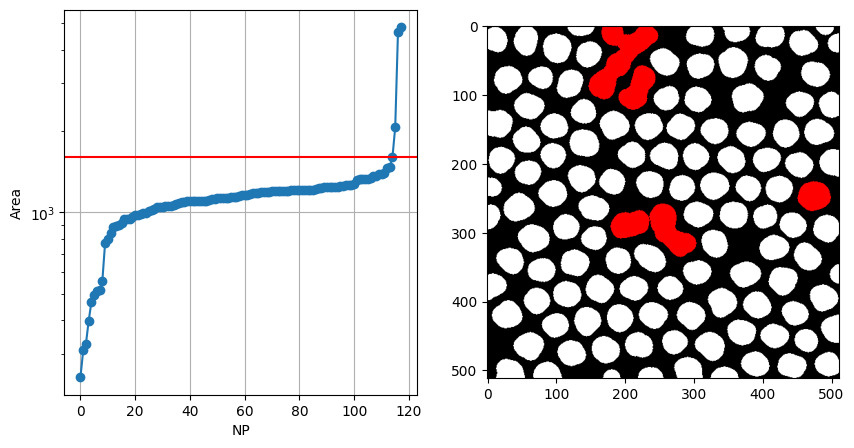

In [10]:
from skimage import measure

area_thresh = 1600
def exclude_agglomerated_NPs(bin, area_thresh = 1600, return_info = False):
 
    labeled_bin = measure.label(bin)   # To assign unique label to each NP
    regions = measure.regionprops(labeled_bin)    # Get region properties of the labeled regions

    excluded_regions = []
    filtered_labeled_bin = labeled_bin.copy()
    for region in regions:
        if region.area > area_thresh:
            filtered_labeled_bin[labeled_bin == region.label] = 0
            excluded_regions.append(region.label)

    if return_info:
        return(filtered_labeled_bin, labeled_bin, regions, excluded_regions)
    else:
        return(filtered_labeled_bin)

filtered_labeled_bin, labeled_bin, regions, excluded_regions = exclude_agglomerated_NPs(bin, return_info = True)


areas = [region.area for region in regions]
areas_sorted = sorted(areas)
labeled_rgb = color.label2rgb(labeled_bin, bg_label=0)
labeled_rgb[labeled_bin > 0] = [1,1,1]
for label in excluded_regions:
    labeled_rgb[labeled_bin == label] = [1,0,0]

fig, ax = plt.subplots(1, 2, figsize=(10,5))
ax[0].plot(areas_sorted, marker='o')
ax[0].set_xlabel('NP')
ax[0].set_ylabel('Area')
ax[0].grid()
ax[0].set_yscale('log')
ax[0].axhline(y = area_thresh, color = 'r')
ax[1].imshow(labeled_rgb)
print('regions before:', len(regions))
print('regions after filtering:', len(measure.regionprops(filtered_labeled_bin)))


### (Optional) Optimizing segmentation via euclidean transform local maximas
Temos duas opções: (i) Seguir com a imagem acima e descartar partículas aglomeradas ou (ii) Tentar segmentar a aglomeração. É ambicioso, pois a tendência é gerar falsos positivos e partículas sem bordas, que prejudicariam a reconstrução 3D, mas podem ajudar PCA, talvez?

In [9]:
from scipy.ndimage import distance_transform_edt
ibin3 = ~bin3
distance_transform = distance_transform_edt(ibin3)
fig,ax = plt.subplots(1,2, figsize=(10,5))
ax[0].imshow(ibin3)
ax[1].imshow(distance_transform)

NameError: name 'bin3' is not defined

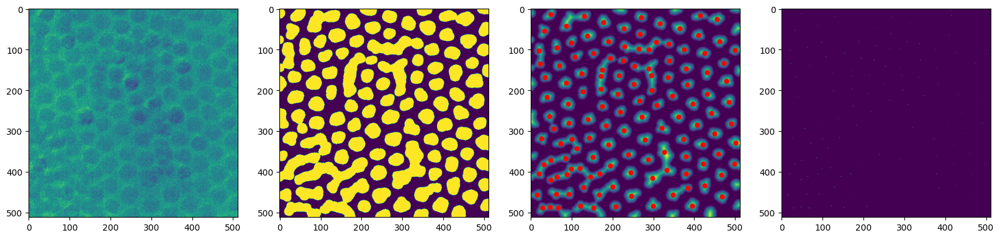

In [97]:
from skimage.feature import peak_local_max

# Find local maxima in the distance transform
maxima_coords = peak_local_max(distance_transform, min_distance=10) # De 20 para 10, adiciona consideravelmente mais partículas. Melhor nada do que falsos positivos? Para PCA?

# Create markers with the same shape as the distance transform
markers = np.zeros_like(distance_transform, dtype=np.int32)
for idx, (y, x) in enumerate(maxima_coords, start=1):
    markers[y, x] = idx
fig,ax = plt.subplots(1,4, figsize=(20,5))
ax[0].imshow(rsimg)
ax[1].imshow(ibin3)
ax[2].imshow(distance_transform)
ax[2].plot(maxima_coords[:, 1], maxima_coords[:, 0], 'ro', markersize=5)
ax[3].imshow(markers) # Look closely, it is not blank!

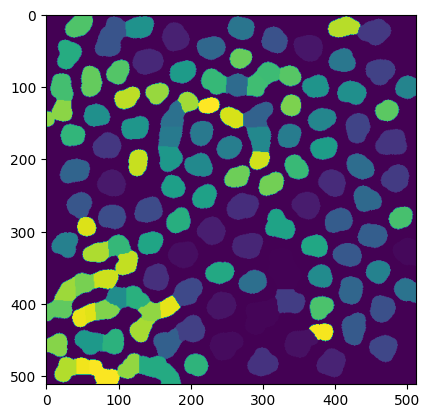

In [98]:
from skimage.segmentation import watershed

# Apply watershed transform
labels = watershed(-distance_transform, markers, mask=ibin3)
plt.imshow(labels)

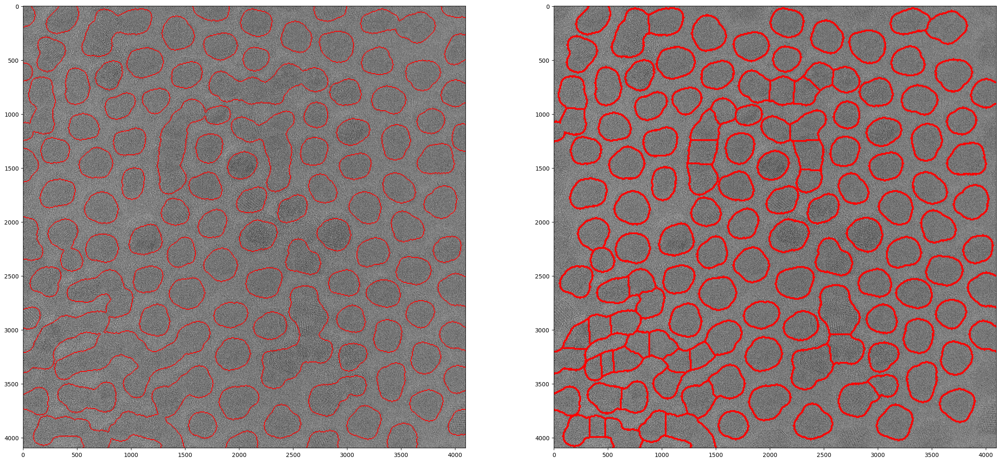

In [99]:
border_img = morphology.dilation(labels) ^ labels
up_border_img = transform.resize(border_img, raw.shape[:2], mode='constant', preserve_range=True)
hraw2 = raw.copy()
hraw2 = color.gray2rgb(hraw2)/np.max(raw)
hraw2[up_border_img>0] = [1,0,0]

fig,ax = plt.subplots(1,2, figsize=(30,15))
ax[0].imshow(hraw)
ax[1].imshow(hraw2)

### Via other methods... Edge detection, Blob detection, ML (CNN), template matching?

# **Cropping**

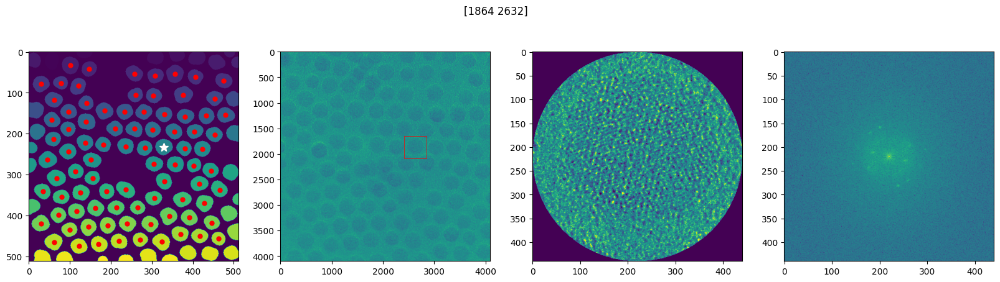

In [11]:
# Aqui, as partículas perto da borda, tornam-se um problema. Podemos excluí-las, ou expandir a imagem original e fazer um crop remendado. Isso, no entanto, caga a fft. Por enquanto, sigamos excluindo-as.
from scipy.ndimage import distance_transform_edt
from skimage.feature import peak_local_max
import matplotlib.patches as patches

radius = 220
def crop_save_and_return_NP_number(img, filtered_labeled_bin, radius, etd_min_distance = 20, sample_size = 8, return_info = False): # etd_mean_distance also a function of NP size in pixels

    edt = distance_transform_edt(filtered_labeled_bin)
    bin_coords = peak_local_max(edt, min_distance = etd_min_distance)
    coords = bin_coords*sample_size

    # For img expansion. Dont forget to add a to coords afterwards.
    # a = 100
    # expanded_img = np.pad(img, ((a, a), (a, a)), mode='constant')

    filtered_coords = []
    crop_number = 1
    for coord in coords:
        # try:
        if (np.min(coord) >= radius) and (np.max(coord) <= img.shape[0]-radius): # Eliminate particles close to border
            crop = img[coord[0]-radius:coord[0]+radius, coord[1]-radius:coord[1]+radius]

            # Creating circular crop
            mask = np.zeros_like(crop, dtype=bool)
            rr, cc = draw.disk((radius, radius), radius)
            mask[rr, cc] = True
            crop_circular = np.zeros_like(crop)
            crop_circular[mask] = crop[mask]

            filtered_coords.append(coord)
            np.save(path_crops + file_name[:-4] + '-' + str(crop_number), crop_circular)
            crop_number += 1
        # except (IndexError):
        #     pass

    if return_info:
        return(crop_number, np.array(filtered_coords))
    else: 
        return(crop_number)

_, coords = crop_save_and_return_NP_number(img, filtered_labeled_bin, radius = radius, return_info = True)    

# Checking

NP_for_display = 10
bin_coords = coords / 8

for coord in coords[NP_for_display : NP_for_display + 1]:
    fig,ax = plt.subplots(1,4, figsize=(20,5))
    fig.suptitle(coord)
    ax[0].imshow(filtered_labeled_bin)
    ax[0].plot(bin_coords[:, 1], bin_coords[:, 0], 'ro', markersize=5)
    ax[0].plot(coord[1]//8, coord[0]//8, 'w*', markersize=10)
    ax[1].imshow(img)
    # ax[1].plot(coord[1], coord[0], 'w*', markersize=10)
    ax[1].add_patch(patches.Rectangle((coord[1] - radius, coord[0] - radius), radius*2, radius*2, linewidth=0.5, edgecolor='r', facecolor='none'))

    crop = img[coord[0]-radius:coord[0]+radius, coord[1]-radius:coord[1]+radius]

    # Creating circular crop
    mask = np.zeros_like(crop, dtype=bool)
    rr, cc = draw.disk((radius, radius), radius)
    mask[rr, cc] = True
    crop_circular = np.zeros_like(crop)
    crop_circular[mask] = crop[mask]
    
    ax[2].imshow(crop_circular)
    fft = np.log(np.abs(np.fft.fftshift(np.fft.fft2(crop_circular))))
    ax[3].imshow(fft)

In [ ]:
# To check each crop. Clear outputs after checking!
for file in os.listdir(path_crops)[:10]:
    img = np.load(path_crops+file)
    fig,ax = plt.subplots()
    ax.imshow(img)

# Performing for every img

In [12]:
start = time.process_time()

# Delete all files in target folder first
for file_name in os.listdir(path_crops):
    if os.path.isfile(path_crops + file_name):
        os.remove(path_crops + file_name)

NP_total = 0
i = 0
i_total = len(os.listdir(path_raw))
for file_name in os.listdir(path_raw):
    img = io.imread(path_raw + file_name, as_gray=True)
    rsimg = downsample(img)
    bin = img_to_segmented_bin(rsimg)
    filtered_bin = exclude_agglomerated_NPs(bin)
    NPs = crop_save_and_return_NP_number(img, filtered_bin, radius = radius)
    NP_total += NPs
    i += 1
    print(i,'of', i_total, 'done.')

print('Tempo de execução:', time.process_time() - start, 's.')
print('Número de partículas acumulado:', NP_total)

1 of 173 done.
2 of 173 done.
3 of 173 done.
4 of 173 done.
5 of 173 done.
6 of 173 done.
7 of 173 done.
8 of 173 done.
9 of 173 done.
10 of 173 done.
11 of 173 done.
12 of 173 done.
13 of 173 done.
14 of 173 done.
15 of 173 done.
16 of 173 done.
17 of 173 done.
18 of 173 done.
19 of 173 done.
20 of 173 done.
21 of 173 done.
22 of 173 done.
23 of 173 done.
24 of 173 done.
25 of 173 done.
26 of 173 done.
27 of 173 done.
28 of 173 done.
29 of 173 done.
30 of 173 done.
31 of 173 done.
32 of 173 done.
33 of 173 done.
34 of 173 done.
35 of 173 done.
36 of 173 done.
37 of 173 done.
38 of 173 done.
39 of 173 done.
40 of 173 done.
41 of 173 done.
42 of 173 done.
43 of 173 done.
44 of 173 done.
45 of 173 done.
46 of 173 done.
47 of 173 done.
48 of 173 done.
49 of 173 done.
50 of 173 done.
51 of 173 done.
52 of 173 done.
53 of 173 done.
54 of 173 done.
55 of 173 done.
56 of 173 done.
57 of 173 done.
58 of 173 done.
59 of 173 done.
60 of 173 done.
61 of 173 done.
62 of 173 done.
63 of 173 done.
6